In [1]:
from imageatm.components import DataPrep

dp = DataPrep(
    samples_file = './lots_of_animals.json',
    image_dir = './collection_of_pic',
    job_dir='./lots_of_animals_jobdir'
)
dp.run(resize=True)


D:\Anaconda\envs\image-classification\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
D:\Anaconda\envs\image-classification\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
D:\Anaconda\envs\image-classification\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
D:\Anaconda\envs\image-classification\lib\site-packages\tensorflow\


****** Running image validation ******



100%|███████████████████████████████████████████████████████████████████████████| 26179/26179 [00:41<00:00, 623.80it/s]



****** Running samples validation ******

Class distribution after validation:
butterfly: 2112 (8.1%)
cat: 1668 (6.4%)
chicken: 3098 (11.8%)
cow: 1866 (7.1%)
dog: 4863 (18.6%)
elephant: 1446 (5.5%)
horse: 2623 (10.0%)
sheep: 1820 (7.0%)
spider: 4821 (18.4%)
squirrel: 1862 (7.1%)
Class mapping:
{0: 'butterfly', 1: 'cat', 2: 'chicken', 3: 'cow', 4: 'dog', 5: 'elephant', 6: 'horse', 7: 'sheep', 8: 'spider', 9: 'squirrel'}

****** Creating train/val/test sets ******

Split distribution: train: 0.65, val: 0.15, test: 0.2

Partial split distribution: train: 0.65, val: 0.15, test: 0.20

Train set:
0: 1373 (8.1%)
1: 1084 (6.4%)
2: 2013 (11.8%)
3: 1213 (7.1%)
4: 3160 (18.6%)
5: 940 (5.5%)
6: 1705 (10.0%)
7: 1183 (7.0%)
8: 3134 (18.4%)
9: 1211 (7.1%)
Val set:
0: 317 (8.1%)
1: 250 (6.4%)
2: 465 (11.8%)
3: 280 (7.1%)
4: 730 (18.6%)
5: 217 (5.5%)
6: 393 (10.0%)
7: 273 (7.0%)
8: 723 (18.4%)
9: 279 (7.1%)
Test set:
0: 422 (8.1%)
1: 334 (6.4%)
2: 620 (11.8%)
3: 373 (7.1%)
4: 973 (18.6%)
5: 289 (5.5%)

100%|██████████████████████████████████████████████████████████████████████████| 26179/26179 [00:20<00:00, 1280.39it/s]

Stored 26179 resized images under collection_of_pic_resized
Changed image directory to collection_of_pic_resized


In [2]:
from imageatm.components import Training

trainer = Training(dp.image_dir, dp.job_dir, epochs_train_dense=3, epochs_train_all=1)
trainer.run()

Early stopping patience: 6
Learning rate patience: 2

****** Train dense layers ******

Epoch 1/3
266/266 [==============================] - 2419s 9s/step - loss: 1.3644 - acc: 0.6142 - val_loss: 0.2463 - val_acc: 0.9239

Epoch 00001 val_acc improved from -inf to 0.92386,
saving model to D:\jupyter\lots_of_animals\lots_of_animals_jobdir\models\model_mobilenet_01_0.924.hdf5
Epoch 2/3
266/266 [==============================] - 2371s 9s/step - loss: 0.5777 - acc: 0.8176 - val_loss: 0.1924 - val_acc: 0.9394

Epoch 00002 val_acc improved from 0.92386 to 0.93939,
saving model to D:\jupyter\lots_of_animals\lots_of_animals_jobdir\models\model_mobilenet_02_0.939.hdf5
Epoch 3/3
266/266 [==============================] - 2507s 9s/step - loss: 0.4548 - acc: 0.8522 - val_loss: 0.1742 - val_acc: 0.9437

Epoch 00003 val_acc improved from 0.93939 to 0.94372,
saving model to D:\jupyter\lots_of_animals\lots_of_animals_jobdir\models\model_mobilenet_03_0.944.hdf5

****** Train all layers ******

Epoch 4/4


****** Load model ******

loaded D:\jupyter\lots_of_animals\lots_of_animals_jobdir\models\model_mobilenet_03_0.944.hdf5

****** Make prediction on test set ******

328/328 [==============================] - 573s 2s/step

****** Plot distribution on test set ******



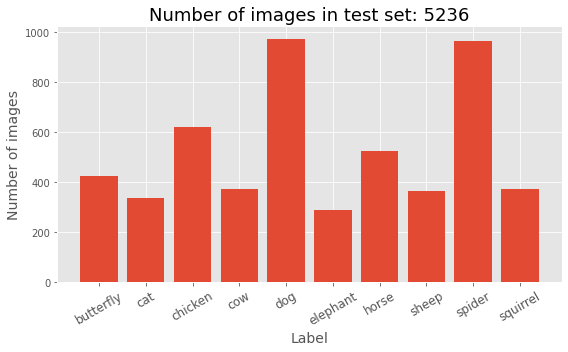


****** Plot classification report ******

         	prec	rec	f1	support
butterfly	0.97	0.92	0.95	422	
cat      	1.00	0.85	0.92	334	
chicken  	0.97	0.97	0.97	620	
cow      	0.82	0.93	0.87	373	
dog      	0.93	0.96	0.95	973	
elephant 	0.99	0.89	0.94	289	
horse    	0.92	0.93	0.93	525	
sheep    	0.91	0.88	0.90	364	
spider   	0.97	0.98	0.98	964	
squirrel 	0.94	0.97	0.95	372	
macro avg	0.94	0.93	0.93	5236	
weighted avg	0.94	0.94	0.94	5236	

****** Plot confusion matrix (recall) ******



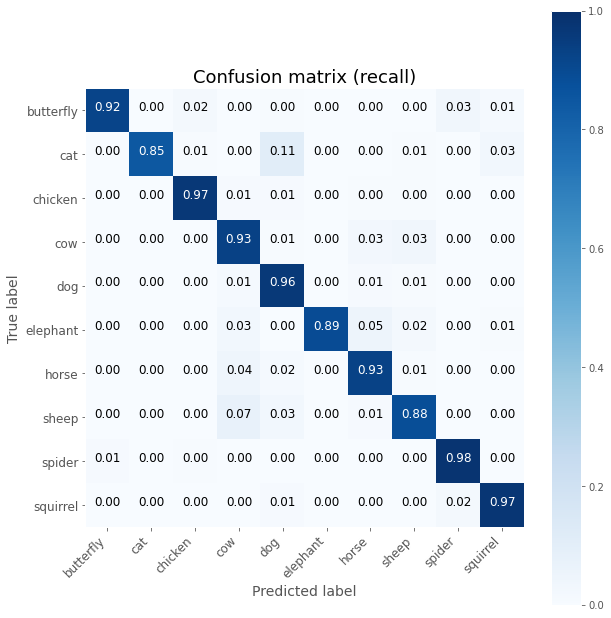


****** Plot confusion matrix (precision) ******



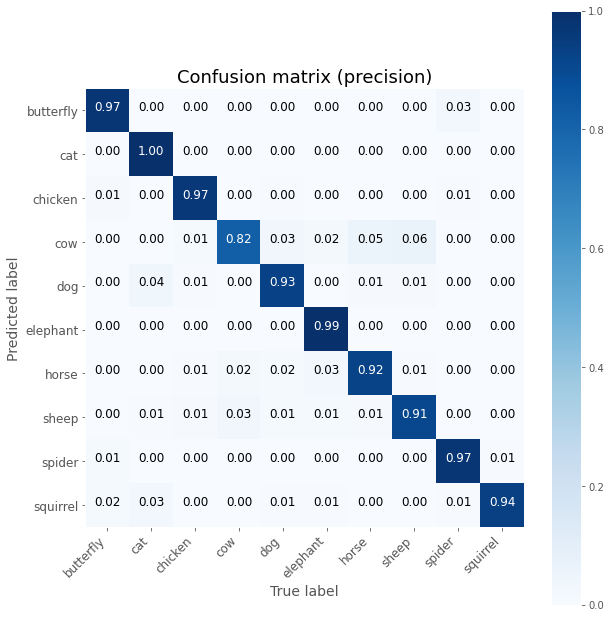


****** Plot correct and wrong examples ******



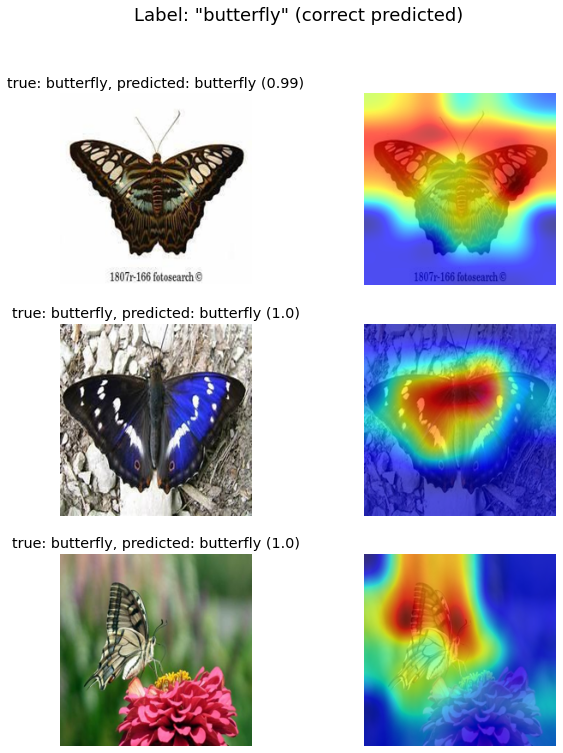

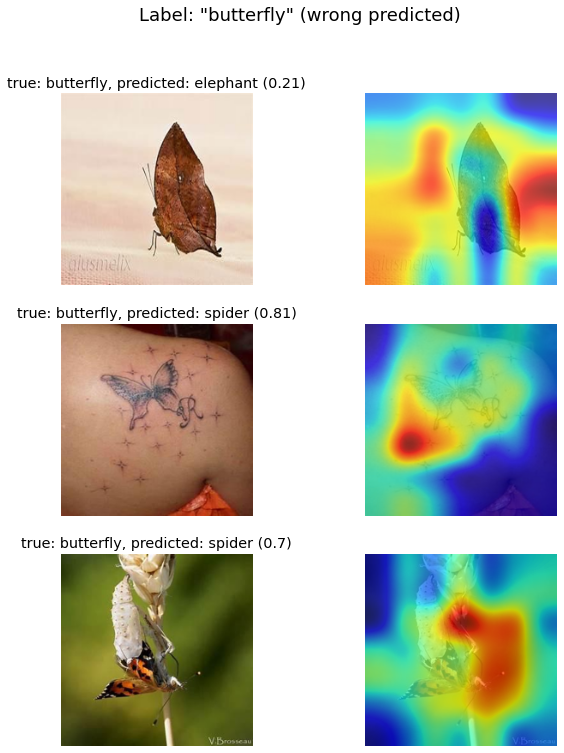

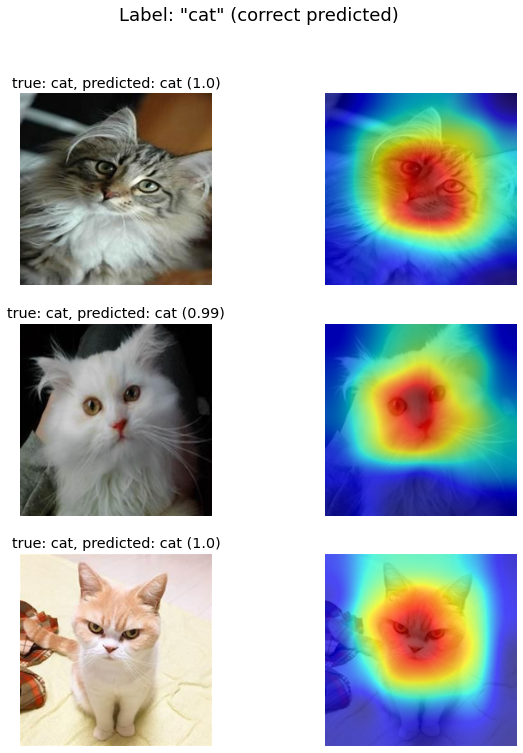

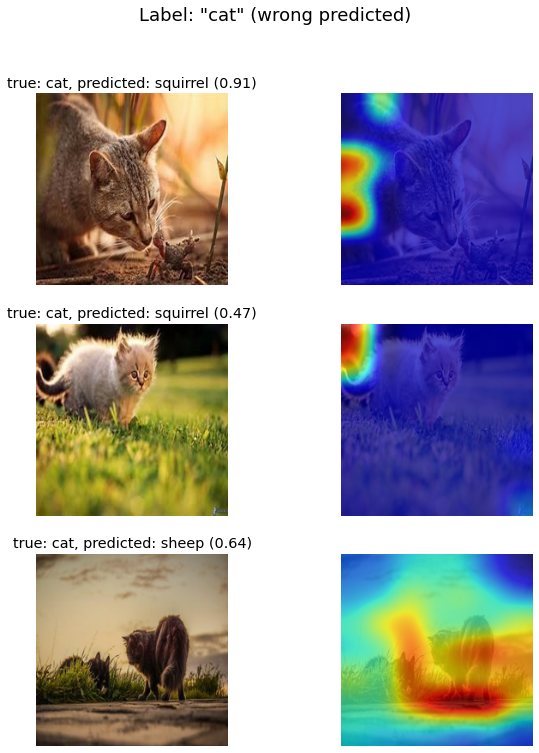

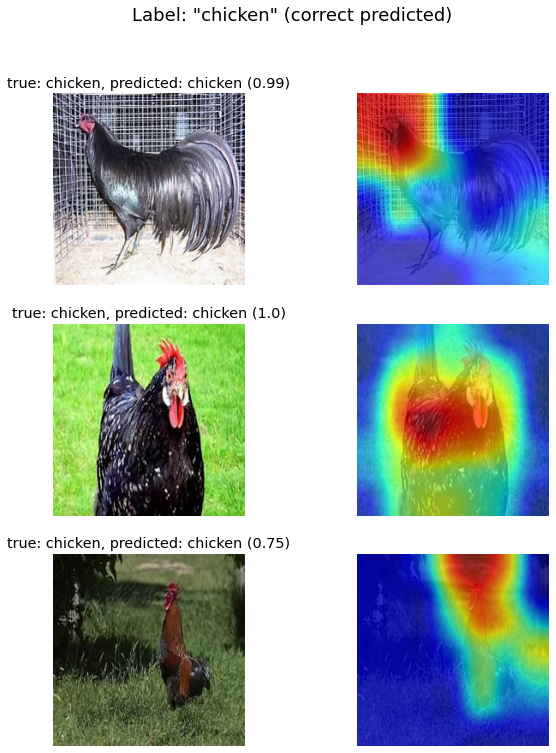

...

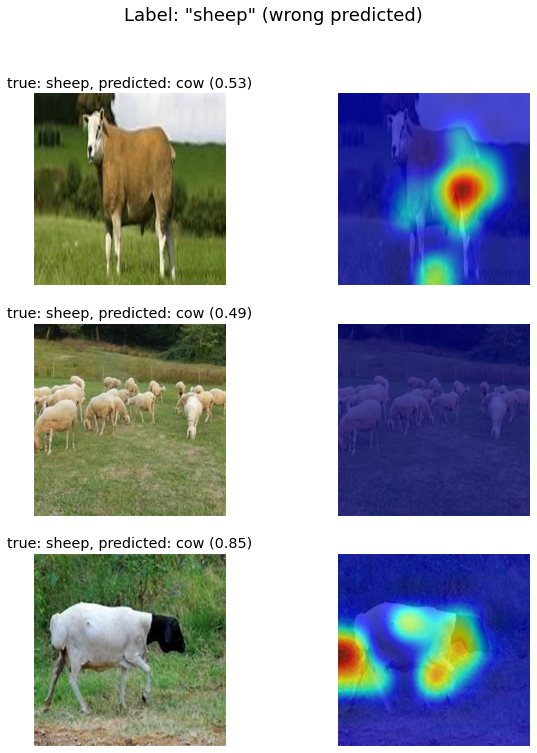

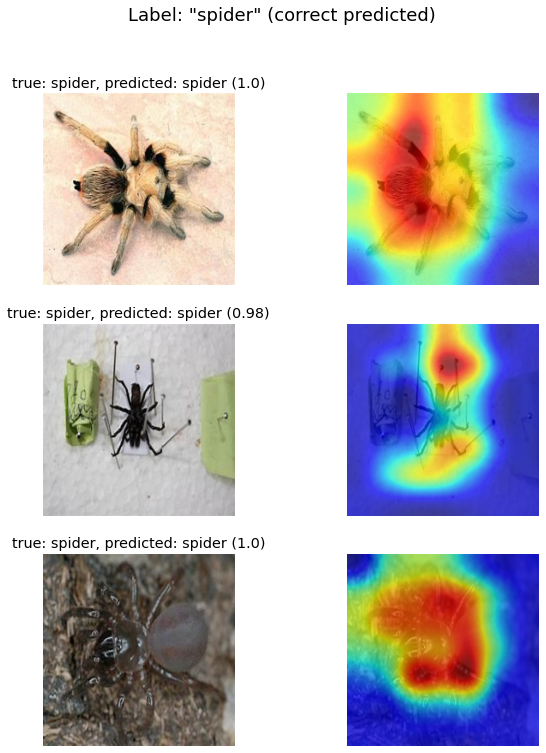

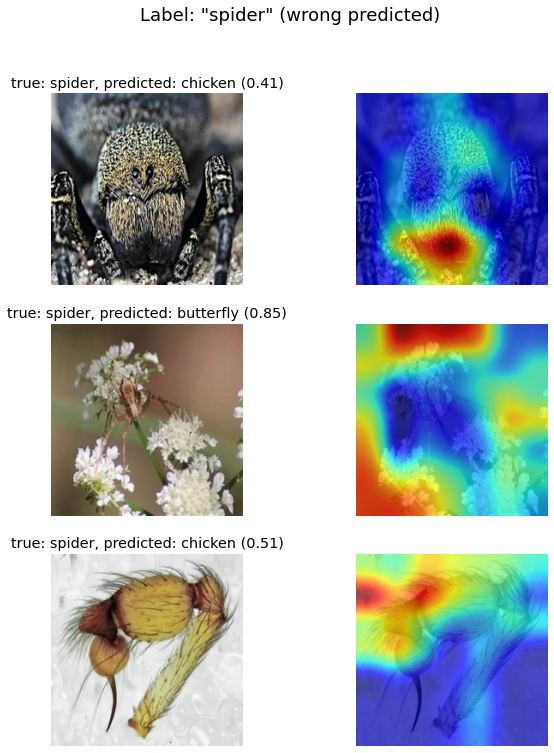

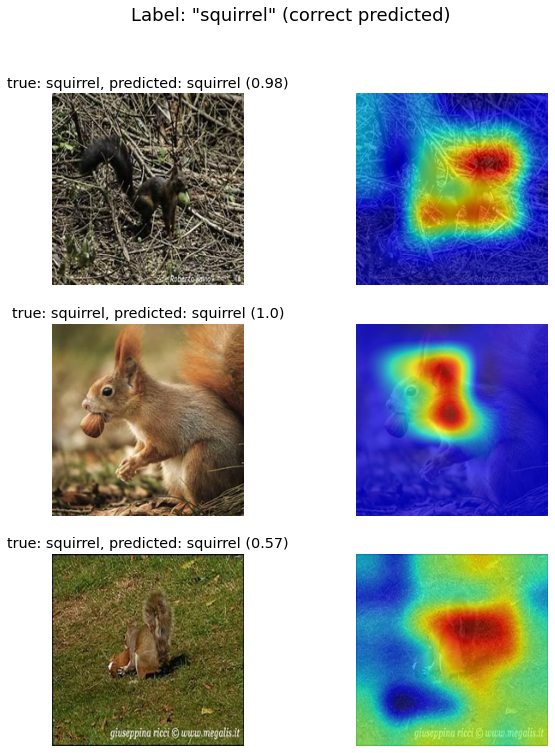

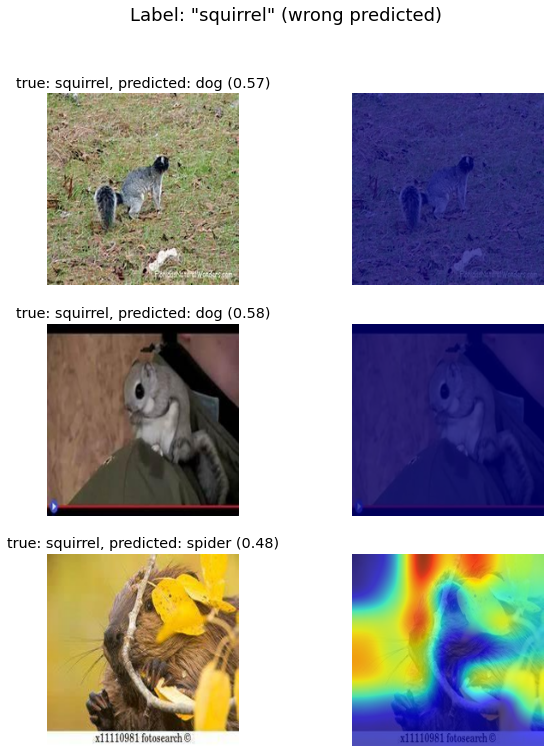

In [3]:
from imageatm.components import Evaluation
e = Evaluation(image_dir=dp.image_dir, job_dir=dp.job_dir)
e.run()